In [113]:
import numpy as np
import pandas as pd
from google.cloud import bigquery
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from scipy.stats import ttest_ind
import plotly.express as px
import db_dtypes
import bigframes.pandas as bpd
from IPython.display import display, HTML
import math
import statsmodels.api as sm
from typing import Union
import logging
import sys
from google.cloud.exceptions import NotFound
from datetime import datetime, timedelta
import time
import os
import json
from google.auth.transport.requests import Request
from google.oauth2.credentials import Credentials
from google.auth import default 
import pandas as pd


# Configure logging
logging.basicConfig(
    level=logging.INFO,
    format='%(asctime)s %(levelname)s:%(message)s',
    handlers=[
        logging.StreamHandler(sys.stdout)
    ]
)


mkt_data = """

WITH holdout_entities AS (
  SELECT
         entity_id,
        `Release Date` AS release_date
  FROM `logistics-data-storage-staging.long_term_pricing.global_holdout_rollout`
  WHERE `Release Date` < DATE_TRUNC(CURRENT_DATE(), WEEK(MONDAY))
  AND entity_id in ('FP_PK','PY_DO','PY_BO', 'FP_TW', 'PY_PY', 'DJ_CZ', 'PY_EC','MJM_AT' ,'PY_PE', 'PY_AR' ,'PY_GT','PY_SV' ,'FP_PH','PY_NI' ,'NP_HU' ,'FP_MM','EF_GR' ,'AP_PA','YS_TR', 'PY_UY' ,'OP_SE' ,'PY_CL' ,'FP_BD' ,'FP_SG' ,'FO_NO' ,'PY_CR', 'FP_LA','PY_HN', 'FP_MY' ,'FP_TH', 'FY_CY', 'PY_VE','PO_FI','TB_QA','TB_OM','TB_KW','TB_JO','TB_IQ','TB_BH','TB_AE','HS_SA')
),
orders as (
  SELECT
       dps.entity_id entity_id
      ,date_trunc(dps.created_date, WEEK(MONDAY)) week
      ,dps.dps_customer_id customer_id
      ,COUNT(mkt.order_id) AS orders
      ,SUM(mkt.analytical_profit) AS analytical_profit
  FROM `fulfillment-dwh-production.cl.dps_sessions_mapped_to_orders` dps
  JOIN holdout_entities AS e
    ON dps.entity_id = e.entity_id
  left join fulfillment-dwh-production.curated_data_shared_mkt.bima_order_profitability mkt
    ON mkt.global_entity_id = dps.entity_id
    AND mkt.order_id = dps.platform_order_code
    AND order_date >= DATE_TRUNC(DATE_SUB(release_date, INTERVAL 8 WEEK), WEEK(MONDAY))
    AND order_date < DATE_TRUNC(CURRENT_DATE(), WEEK(MONDAY))
    AND global_entity_id in ('FP_PK','PY_DO','PY_BO', 'FP_TW', 'PY_PY', 'DJ_CZ', 'PY_EC','MJM_AT' ,'PY_PE', 'PY_AR' ,'PY_GT','PY_SV' ,'FP_PH','PY_NI' ,'NP_HU' ,'FP_MM','EF_GR' ,'AP_PA','YS_TR', 'PY_UY' ,'OP_SE' ,'PY_CL' ,'FP_BD' ,'FP_SG' ,'FO_NO' ,'PY_CR', 'FP_LA','PY_HN', 'FP_MY' ,'FP_TH', 'FY_CY', 'PY_VE','PO_FI','TB_QA','TB_OM','TB_KW','TB_JO','TB_IQ','TB_BH','TB_AE','HS_SA')
  WHERE dps.created_date >= DATE_TRUNC(DATE_SUB(e.release_date, INTERVAL 8 WEEK) , WEEK(MONDAY))
    AND dps.created_date < DATE_TRUNC(CURRENT_DATE(), WEEK(MONDAY))
    AND dps.platform_order_code IS NOT NULL
    AND dps.is_own_delivery
    AND dps.is_sent
    AND vendor_vertical_parent IN ('Restaurant','restaurant','restaurants')
    AND dps.entity_id in ('FP_PK','PY_DO','PY_BO', 'FP_TW', 'PY_PY', 'DJ_CZ', 'PY_EC','MJM_AT' ,'PY_PE', 'PY_AR' ,'PY_GT','PY_SV' ,'FP_PH','PY_NI' ,'NP_HU' ,'FP_MM','EF_GR' ,'AP_PA' ,'YS_TR', 'PY_UY' ,'OP_SE' ,'PY_CL' ,'FP_BD' ,'FP_SG' ,'FO_NO' ,'PY_CR', 'FP_LA','PY_HN', 'FP_MY' ,'FP_TH', 'FY_CY', 'PY_VE','PO_FI','TB_QA','TB_OM','TB_KW','TB_JO','TB_IQ','TB_BH','TB_AE','HS_SA')
  GROUP BY 1, 2, 3
), 
customer_information AS (
  SELECT
         e.entity_id,
         e.release_date,
         CASE WHEN d.created_date <= e.release_date THEN FALSE ELSE COALESCE(is_customer_holdout, FALSE) END AS is_customer_holdout,
         d.customer_id
  FROM `fulfillment-dwh-production.cl.dps_holdout_users` AS d
  JOIN holdout_entities AS e
        ON d.entity_id = e.entity_id
  LEFT JOIN `fulfillment-dwh-production.cl._bad_dps_logs_ids` bad_ids
    ON d.customer_id = bad_ids.id
  WHERE d.created_date >= '2025-01-01' 
    AND d.created_Date <  DATE_TRUNC(CURRENT_DATE(), WEEK(MONDAY))
    AND d.customer_id IS NOT NULL
    AND bad_ids.id IS NULL
  GROUP BY 1, 2, 3, 4
)
SELECT 
   e.entity_id,
   e.release_date,
   o.week,
   e.is_customer_holdout,
   count(distinct e.customer_id) total_users,
   avg(o.orders) orders_per_user,
   STDDEV_SAMP(o.orders) std_orders_per_user,
   STDDEV_SAMP(o.orders) / SQRT(count(distinct e.customer_id)) standard_error_orders_per_user,
   avg(o.analytical_profit) profit_per_user,
   STDDEV_SAMP(o.analytical_profit) std_profit_per_user,
   STDDEV_SAMP(o.analytical_profit) / SQRT(count(distinct e.customer_id)) standard_error_profit_per_user
FROM customer_information e
JOIN  orders o
  ON o.customer_id = e.customer_id
  AND o.entity_id = e.entity_id
group by 1,2,3,4

"""

# dps_data = """

# WITH holdout_entities AS (
#   SELECT
#          entity_id,
#         `Release Date` AS release_date
#   FROM `logistics-data-storage-staging.long_term_pricing.global_holdout_rollout`
#   WHERE `Release Date` < DATE_TRUNC(CURRENT_DATE(), WEEK)
#   AND entity_id not in ('FP_PK','PY_DO','PY_BO', 'FP_TW', 'PY_PY', 'DJ_CZ', 'PY_EC','MJM_AT' ,'PY_PE', 'PY_AR' ,'PY_GT','PY_SV' ,'FP_PH','PY_NI' ,'NP_HU' ,'FP_MM','EF_GR' ,'AP_PA' ,'YS_TR', 'PY_UY' ,'OP_SE' ,'PY_CL' ,'FP_BD' ,'FP_SG' ,'FO_NO' ,'PY_CR', 'FP_LA','PY_HN', 'FP_MY' ,'FP_TH', 'FY_CY', 'PY_VE','PO_FI','TB_QA','TB_OM','TB_KW','TB_JO','TB_IQ','TB_BH','TB_AE','HS_SA')
# ),
# orders as (
#   SELECT
#        dps.entity_id entity_id
#       ,dps.dps_customer_id customer_id
#       ,COUNT(case when dps.created_date <= e.release_date then dps.platform_order_code end) AS orders_pre
#       ,COUNT(case when dps.created_date > e.release_date then dps.platform_order_code end) AS orders_post
#       ,SUM(case when dps.created_date <= e.release_date then dps.fully_loaded_gross_profit_eur end) AS analytical_profit_pre
#       ,SUM(case when dps.created_date > e.release_date then dps.fully_loaded_gross_profit_eur end) AS analytical_profit_post
#   FROM `fulfillment-dwh-production.cl.dps_sessions_mapped_to_orders` dps
#   JOIN holdout_entities AS e
#     ON dps.entity_id = e.entity_id
#   WHERE dps.created_date >= DATE_SUB(e.release_date, INTERVAL 8 WEEK) 
#     AND dps.created_date < CURRENT_DATE
#     AND dps.platform_order_code IS NOT NULL
#     AND dps.is_own_delivery
#     AND dps.is_sent
#     AND vendor_vertical_parent IN ('Restaurant','restaurant','restaurants')
#     AND dps.entity_id not in ('FP_PK','PY_DO','PY_BO', 'FP_TW', 'PY_PY', 'DJ_CZ', 'PY_EC','MJM_AT' ,'PY_PE', 'PY_AR' ,'PY_GT','PY_SV' ,'FP_PH','PY_NI' ,'NP_HU' ,'FP_MM','EF_GR' ,'AP_PA' ,'YS_TR', 'PY_UY' ,'OP_SE' ,'PY_CL' ,'FP_BD' ,'FP_SG' ,'FO_NO' ,'PY_CR', 'FP_LA','PY_HN', 'FP_MY' ,'FP_TH', 'FY_CY', 'PY_VE','PO_FI','TB_QA','TB_OM','TB_KW','TB_JO','TB_IQ','TB_BH','TB_AE','HS_SA')
#   GROUP BY 1, 2
# ), 
# customer_information AS (
#   SELECT
#          e.entity_id,
#          e.release_date,
#          d.created_
#          CASE WHEN d.created_date <= e.release_date THEN FALSE ELSE COALESCE(is_customer_holdout, FALSE) END AS is_customer_holdout,
#          d.customer_id
#   FROM `fulfillment-dwh-production.cl.dps_holdout_users` AS d
#   JOIN holdout_entities AS e
#         ON d.entity_id = e.entity_id
#   LEFT JOIN `fulfillment-dwh-production.cl._bad_dps_logs_ids` bad_ids
#     ON d.customer_id = bad_ids.id
#   WHERE d.created_date BETWEEN '2025-01-01' AND CURRENT_DATE()
#     AND d.customer_id IS NOT NULL
#     AND bad_ids.id IS NULL
#   GROUP BY 1, 2, 3, 4
# )
# SELECT 
#    e.entity_id,
#    e.customer_id,
#    e.is_customer_holdout,
#    o.orders_pre,
#    o.orders_post,
#    o.analytical_profit_pre,
#    o.analytical_profit_post
# FROM customer_information e
# LEFT JOIN orders o
#   ON o.customer_id = e.customer_id
#   AND o.entity_id = e.entity_id


# """


In [116]:
if __name__ == "__main__":

    project = "logistics-customer-staging"
    
    client = initialize_bigquery_client(project)
    
    start_time = time.time()
    mkt_df = client.query(mkt).to_dataframe()
    elapsed_time = time.time() - start_time

    # ------------------------------------------------------------------------------
    # GET DATA FROM DB
    # ------------------------------------------------------------------------------

    #raw_data = extract_data("logistics-customer-staging",mkt_data, dps_data)

    # ------------------------------------------------------------------------------
    # CLEAN DATA
    # ------------------------------------------------------------------------------

    #make sure 0's are converted to NaN's where applicable
    #raw_data_cleaned = apply_nan_to_orders(raw_data)
    
    #remove customers with no data in the pre period or the post period or in both periods
    #needed_cols = ['analytical_profit_pre', 'analytical_profit_post','orders_pre','orders_post']
    #raw_data_final = drop_missing_data(raw_data_cleaned, needed_cols)

    #create csv with data
    #create_csv(raw_data_final, "profitable_growth_raw")
    



2025-03-25 00:12:27,265 INFO:Initializing BigQuery client for project: logistics-customer-staging


/Users/shazeb.asad/global_pricing/venv_bayesian/lib/python3.13/site-packages/google/auth/_default.py:76: UserWarning: Your application has authenticated using end user credentials from Google Cloud SDK without a quota project. You might receive a "quota exceeded" or "API not enabled" error. See the following page for troubleshooting: https://cloud.google.com/docs/authentication/adc-troubleshooting/user-creds. 
  warnings.warn(_CLOUD_SDK_CREDENTIALS_WARNING)


2025-03-25 00:12:27,856 INFO:BigQuery client initialized successfully for project: logistics-customer-staging


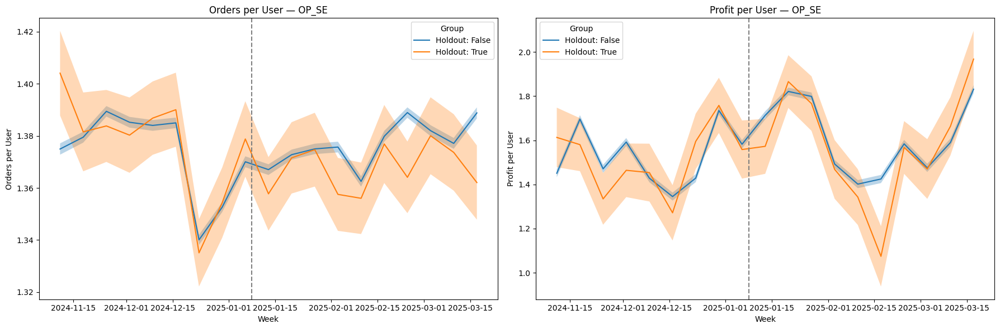

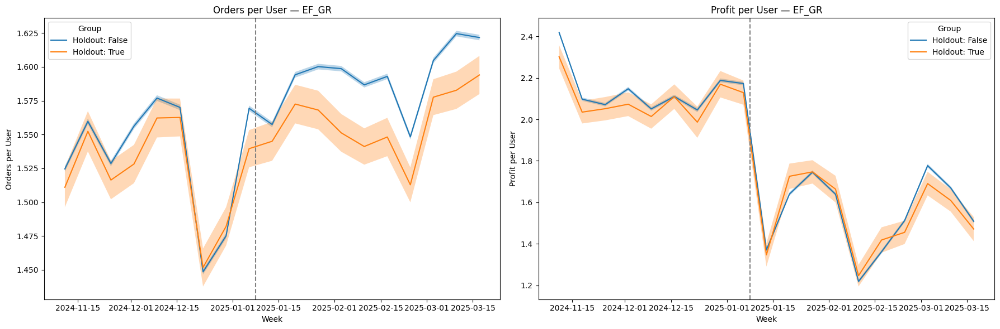

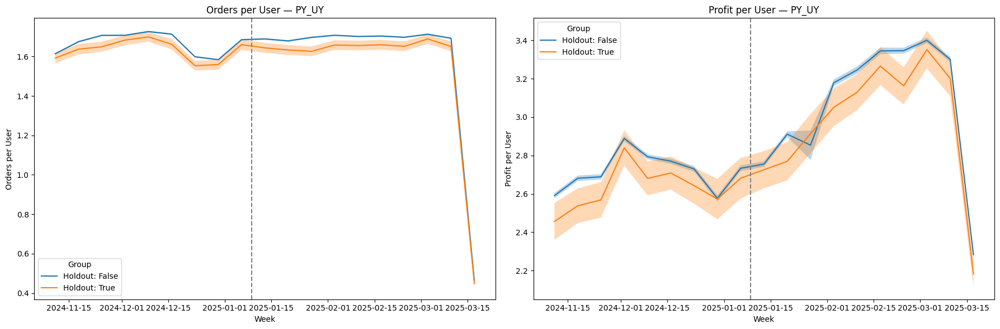

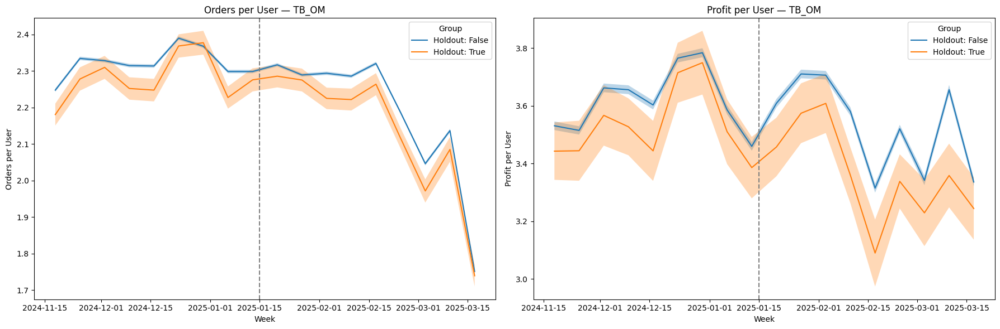

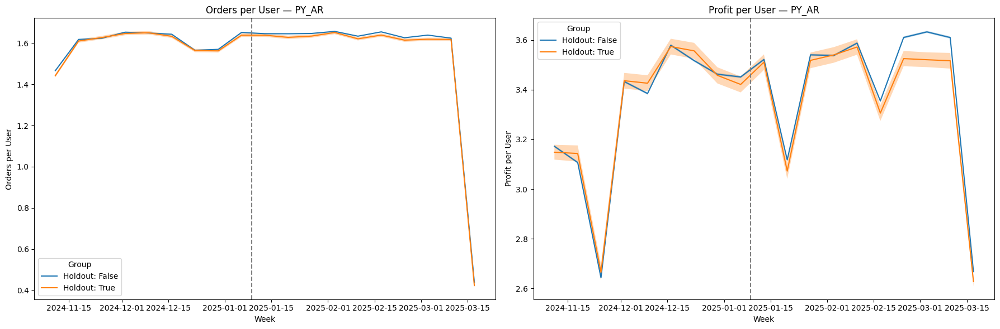

...

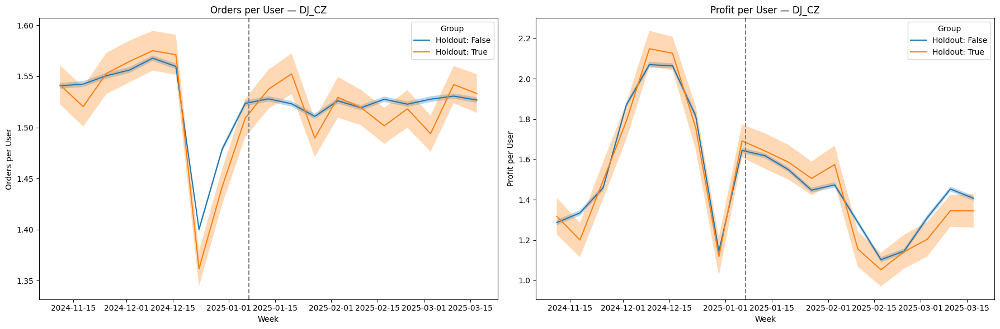

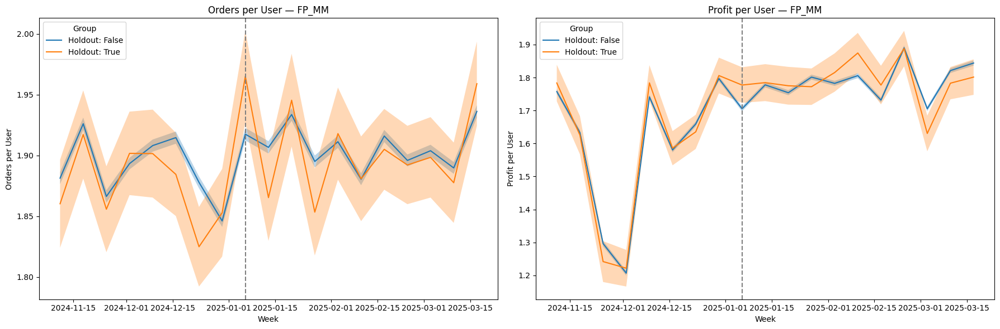

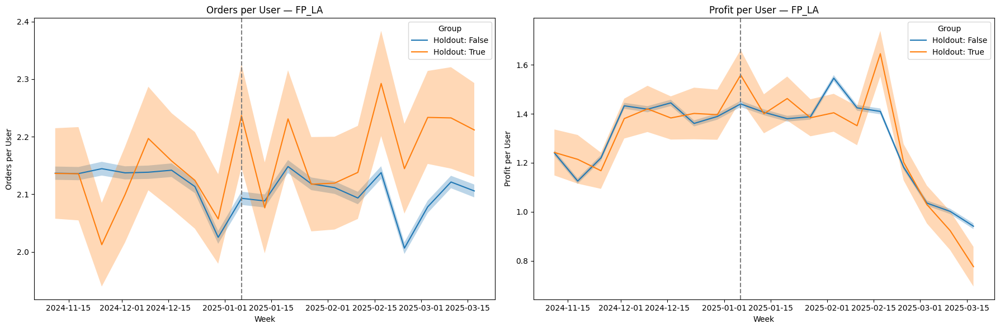

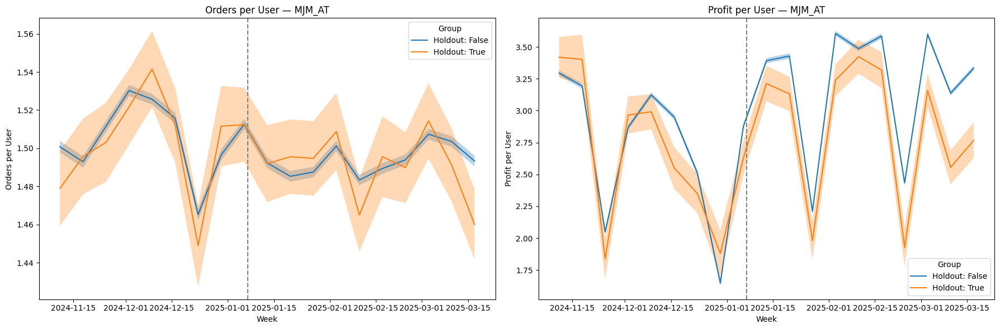

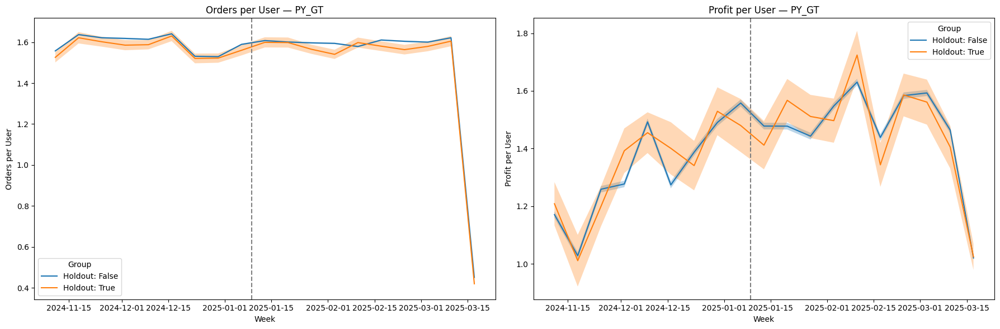

In [117]:
def plot_orders_and_profit_with_error_bands(df, entity_id):
    # Filter for specific entity_id
    tt = df[df['entity_id'] == entity_id].copy()

    # Convert dates
    tt['week'] = pd.to_datetime(tt['week'])
    tt['release_date'] = pd.to_datetime(tt['release_date'])

    # Extract release date
    release_dates = tt['release_date'].dropna().unique()
    release_date = release_dates[0] if len(release_dates) > 0 else None

    # Create 1 row, 2 columns of subplots
    fig, axes = plt.subplots(1, 2, figsize=(18, 6), sharex=True)

    # Plot orders_per_user
    for holdout_value, group in tt.groupby('is_customer_holdout'):
        group_sorted = group.sort_values('week')

        sns.lineplot(data=group_sorted, x='week', y='orders_per_user',
                     label=f'Holdout: {holdout_value}', ax=axes[0])
        axes[0].fill_between(group_sorted['week'],
                             group_sorted['orders_low_std_err'],
                             group_sorted['orders_high_std_err'],
                             alpha=0.3)
    
    axes[0].set_title(f'Orders per User — {entity_id}')
    axes[0].set_xlabel('Week')
    axes[0].set_ylabel('Orders per User')
    axes[0].legend(title='Group')

    if release_date is not None:
        axes[0].axvline(x=release_date, color='gray', linestyle='--', label='Release Date')

    # Plot profit_per_user
    for holdout_value, group in tt.groupby('is_customer_holdout'):
        group_sorted = group.sort_values('week')

        sns.lineplot(data=group_sorted, x='week', y='profit_per_user',
                     label=f'Holdout: {holdout_value}', ax=axes[1])
        axes[1].fill_between(group_sorted['week'],
                             group_sorted['profit_low_std_err'],
                             group_sorted['profit_high_std_err'],
                             alpha=0.3)

    axes[1].set_title(f'Profit per User — {entity_id}')
    axes[1].set_xlabel('Week')
    axes[1].set_ylabel('Profit per User')
    axes[1].legend(title='Group')

    if release_date is not None:
        axes[1].axvline(x=release_date, color='gray', linestyle='--', label='Release Date')

    plt.tight_layout()
    plt.show()


# Remove rows with missing profit
mkt_df = mkt_df[~mkt_df['profit_per_user'].isna()]

# Add error bounds columns if not already added
mkt_df['orders_high_std_err'] = mkt_df['orders_per_user'] + mkt_df['standard_error_orders_per_user']
mkt_df['orders_low_std_err'] = mkt_df['orders_per_user'] - mkt_df['standard_error_orders_per_user']
mkt_df['profit_high_std_err'] = mkt_df['profit_per_user'] + mkt_df['standard_error_profit_per_user']
mkt_df['profit_low_std_err'] = mkt_df['profit_per_user'] - mkt_df['standard_error_profit_per_user']

# Loop over unique entities
for entity in mkt_df['entity_id'].unique():
    plot_orders_and_profit_with_error_bands(mkt_df, entity)


In [130]:
mkt_df[mkt_df['entity_id'] == 'PY_GT']['week'].max()

datetime.date(2025, 3, 17)

In [118]:
qq = """

WITH holdout_entities AS (
  SELECT
         entity_id,
        `Release Date` AS release_date
  FROM `logistics-data-storage-staging.long_term_pricing.global_holdout_rollout`
  WHERE `Release Date` < DATE_TRUNC(CURRENT_DATE(), WEEK(MONDAY))
  AND entity_id in ('FP_PK','PY_DO','PY_BO', 'FP_TW', 'PY_PY', 'DJ_CZ', 'PY_EC','MJM_AT' ,'PY_PE', 'PY_AR' ,'PY_GT','PY_SV' ,'FP_PH','PY_NI' ,'NP_HU' ,'FP_MM','EF_GR' ,'AP_PA','YS_TR', 'PY_UY' ,'OP_SE' ,'PY_CL' ,'FP_BD' ,'FP_SG' ,'FO_NO' ,'PY_CR', 'FP_LA','PY_HN', 'FP_MY' ,'FP_TH', 'FY_CY', 'PY_VE','PO_FI','TB_QA','TB_OM','TB_KW','TB_JO','TB_IQ','TB_BH','TB_AE','HS_SA')
),
orders as (
  SELECT
       dps.entity_id entity_id
      ,date_trunc(dps.created_date, WEEK(MONDAY)) week
      ,dps.dps_customer_id customer_id
      ,COUNT(mkt.order_id) AS orders
      ,SUM(mkt.analytical_profit) AS analytical_profit
  FROM `fulfillment-dwh-production.cl.dps_sessions_mapped_to_orders` dps
  JOIN holdout_entities AS e
    ON dps.entity_id = e.entity_id
  left join fulfillment-dwh-production.curated_data_shared_mkt.bima_order_profitability mkt
    ON mkt.global_entity_id = dps.entity_id
    AND mkt.order_id = dps.platform_order_code
    AND order_date >= DATE_TRUNC(DATE_SUB(release_date, INTERVAL 8 WEEK), WEEK(MONDAY))
    AND order_date < DATE_TRUNC(CURRENT_DATE(), WEEK(MONDAY))
    AND global_entity_id in ('FP_PK','PY_DO','PY_BO', 'FP_TW', 'PY_PY', 'DJ_CZ', 'PY_EC','MJM_AT' ,'PY_PE', 'PY_AR' ,'PY_GT','PY_SV' ,'FP_PH','PY_NI' ,'NP_HU' ,'FP_MM','EF_GR' ,'AP_PA','YS_TR', 'PY_UY' ,'OP_SE' ,'PY_CL' ,'FP_BD' ,'FP_SG' ,'FO_NO' ,'PY_CR', 'FP_LA','PY_HN', 'FP_MY' ,'FP_TH', 'FY_CY', 'PY_VE','PO_FI','TB_QA','TB_OM','TB_KW','TB_JO','TB_IQ','TB_BH','TB_AE','HS_SA')
  WHERE dps.created_date >= DATE_TRUNC(DATE_SUB(e.release_date, INTERVAL 8 WEEK) , WEEK(MONDAY))
    AND dps.created_date < DATE_TRUNC(CURRENT_DATE(), WEEK(MONDAY))
    AND dps.platform_order_code IS NOT NULL
    AND dps.is_own_delivery
    AND dps.is_sent
    AND vendor_vertical_parent IN ('Restaurant','restaurant','restaurants')
    AND dps.entity_id in ('FP_PK','PY_DO','PY_BO', 'FP_TW', 'PY_PY', 'DJ_CZ', 'PY_EC','MJM_AT' ,'PY_PE', 'PY_AR' ,'PY_GT','PY_SV' ,'FP_PH','PY_NI' ,'NP_HU' ,'FP_MM','EF_GR' ,'AP_PA' ,'YS_TR', 'PY_UY' ,'OP_SE' ,'PY_CL' ,'FP_BD' ,'FP_SG' ,'FO_NO' ,'PY_CR', 'FP_LA','PY_HN', 'FP_MY' ,'FP_TH', 'FY_CY', 'PY_VE','PO_FI','TB_QA','TB_OM','TB_KW','TB_JO','TB_IQ','TB_BH','TB_AE','HS_SA')
  GROUP BY 1, 2, 3
), 
customer_information AS (
  SELECT
         e.entity_id,
         e.release_date,
         CASE WHEN d.created_date <= e.release_date THEN FALSE ELSE COALESCE(is_customer_holdout, FALSE) END AS is_customer_holdout,
         d.customer_id
  FROM `fulfillment-dwh-production.cl.dps_holdout_users` AS d
  JOIN holdout_entities AS e
        ON d.entity_id = e.entity_id
  LEFT JOIN `fulfillment-dwh-production.cl._bad_dps_logs_ids` bad_ids
    ON d.customer_id = bad_ids.id
  WHERE d.created_date >= '2025-01-01' 
    AND d.created_Date <  DATE_TRUNC(CURRENT_DATE(), WEEK(MONDAY))
    AND d.customer_id IS NOT NULL
    AND bad_ids.id IS NULL
  GROUP BY 1, 2, 3, 4
),
joined_data AS (
  SELECT 
    ci.entity_id,
    ci.release_date,
    o.week AS order_week,
    ci.customer_id,
    ci.is_customer_holdout,
    o.orders,
    o.analytical_profit
  FROM customer_information ci
  JOIN orders o
    ON ci.customer_id = o.customer_id
   AND ci.entity_id = o.entity_id
),
all_weeks AS (
  -- Generate all combinations of entity_id, is_customer_holdout, and weeks from release_date to current_date
  SELECT DISTINCT
    entity_id,
    release_date,
    is_customer_holdout,
    week
  FROM (
    SELECT 
      entity_id,
      release_date,
      is_customer_holdout,
      order_week AS week
    FROM joined_data
  )
),
cumulative_metrics AS (
  SELECT
    w.entity_id,
    w.release_date,
    w.is_customer_holdout,
    w.week,

    COUNT(DISTINCT j.customer_id) AS total_users,
    AVG(j.orders) AS orders_per_user,
    STDDEV_SAMP(j.orders) AS std_orders_per_user,
    STDDEV_SAMP(j.orders) / SQRT(COUNT(DISTINCT j.customer_id)) AS standard_error_orders_per_user,
    AVG(j.analytical_profit) AS profit_per_user,
    STDDEV_SAMP(j.analytical_profit) AS std_profit_per_user,
    STDDEV_SAMP(j.analytical_profit) / SQRT(COUNT(DISTINCT j.customer_id)) AS standard_error_profit_per_user

  FROM all_weeks w
  JOIN joined_data j
    ON j.entity_id = w.entity_id
   AND j.is_customer_holdout = w.is_customer_holdout
   AND j.order_week <= w.week -- key for cumulative logic
  GROUP BY 1,2,3,4
  ORDER BY w.entity_id, w.is_customer_holdout, w.week
)

SELECT * FROM cumulative_metrics;

"""


start_time = time.time()
mkt_cum_df = client.query(qq).to_dataframe()
elapsed_time = time.time() - start_time

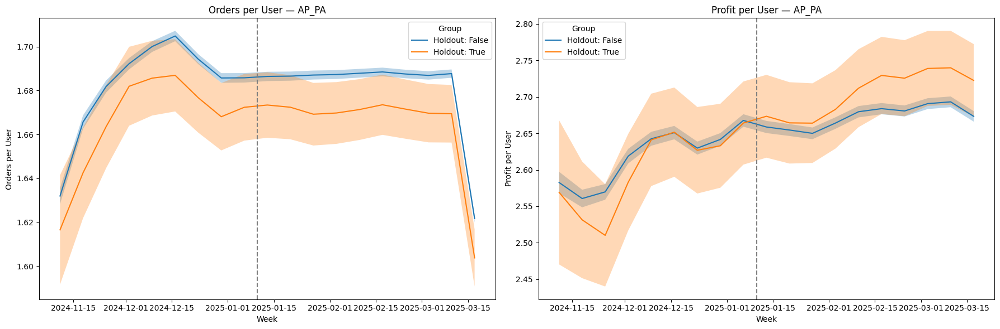

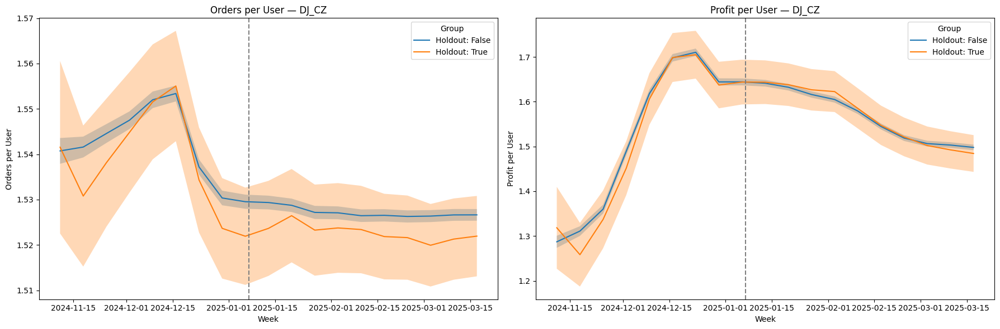

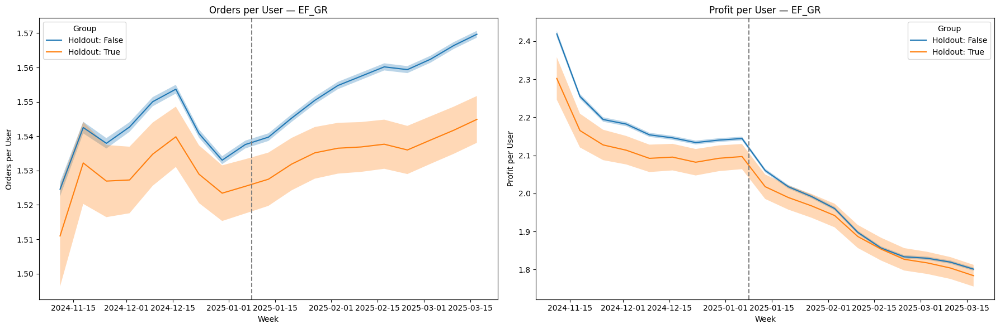

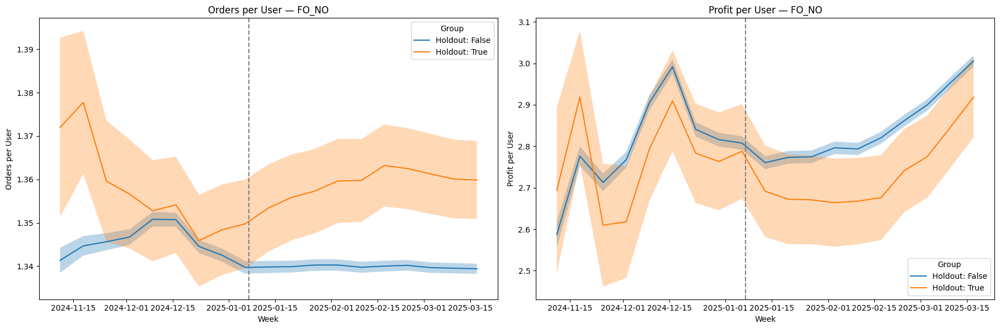

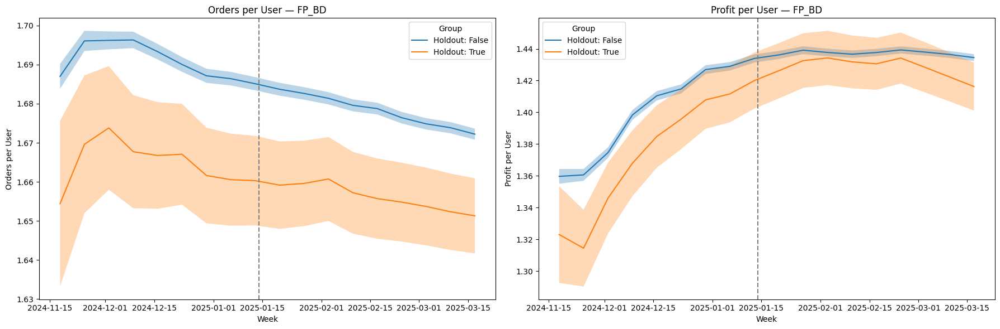

...

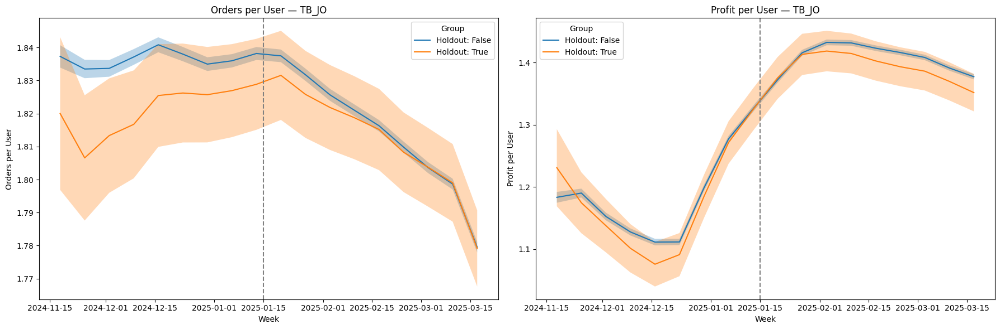

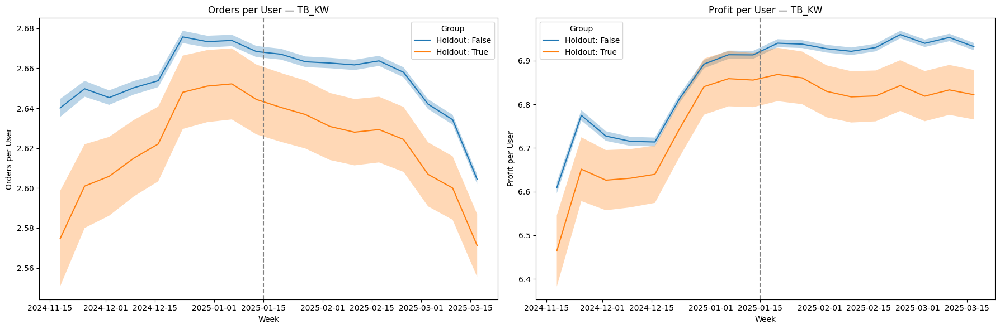

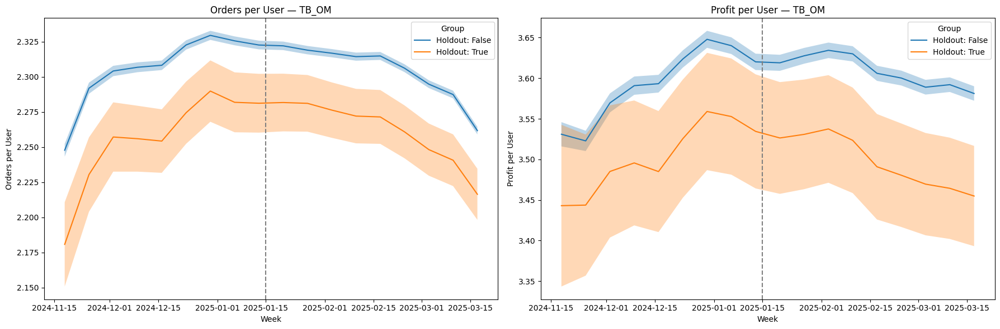

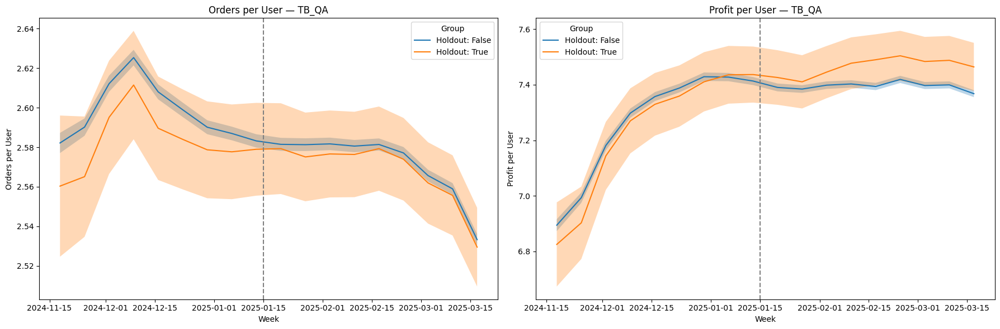

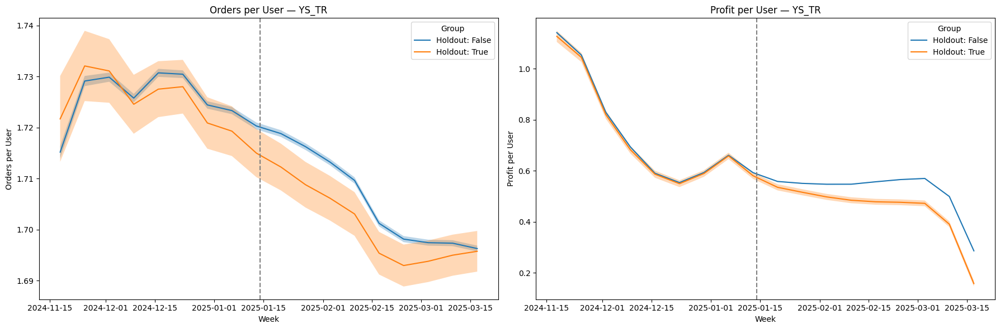

In [122]:
# Remove rows with missing profit
mkt_cum_df = mkt_cum_df[~mkt_cum_df['profit_per_user'].isna()]

# Add error bounds columns if not already added
mkt_cum_df['orders_high_std_err'] = mkt_cum_df['orders_per_user'] + mkt_cum_df['standard_error_orders_per_user']
mkt_cum_df['orders_low_std_err'] = mkt_cum_df['orders_per_user'] - mkt_cum_df['standard_error_orders_per_user']
mkt_cum_df['profit_high_std_err'] = mkt_cum_df['profit_per_user'] + mkt_cum_df['standard_error_profit_per_user']
mkt_cum_df['profit_low_std_err'] = mkt_cum_df['profit_per_user'] - mkt_cum_df['standard_error_profit_per_user']

# Loop over unique entities
for entity in mkt_cum_df['entity_id'].unique():
    plot_orders_and_profit_with_error_bands(mkt_cum_df, entity)